# Generative Painting Style Using Generative Adversarial Networks (GANs)

This project aims to build a Deep Convolutional Generative Adversarial Network (DCGAN) that trains on images of Monet paintings to capture their qualities and then generate Monet-esque images.

---

This project derives from the Kaggle competition with the name Gan Getting Started (I'm Something of a Painter Myself), found here: https://www.kaggle.com/competitions/gan-getting-started/overview

You can find this project at the github repo: https://github.com/chill0121/Kaggle_Projects/tree/main/Adversarial_Painting

## Table of Contents <a name="toc"></a>

---

- 1.[**Data Source Information**](#datasource)
  - 1.1. [Dataset Information](#data)
  - 1.2. [Kaggle Information](#kaggle)
- 2.[**Setup**](#setup)
  - 2.1. [Environment Details for Reproducility](#env)
  - 2.2. [Importing the Data](#dataimport)
- 3.[**Data Preprocessing**](#datapre)
  - 3.1. [First Looks](#firstlook)
  - 3.2. [Image Augmentation](#aug)
- 4.[**Exploratory Data Analysis (EDA)**](#eda)
- 5.[**Models**](#models)
  - 5.1. [Generative Adversarial Network (GAN)](#gan)
- 6.[**Results and Discussion**](#results)
- 7.[**Conclusion**](#conclusion)
  - 7.1. [Possible Areas for Improvement](#improvements)

- [**Appendix A - Online References**](#appendixa)

## 1. Data Source Information <a name="datasource"></a>

---


### 1.1. Data Information: <a name="data"></a>

Color images (256 x 256 pixels) extracted from histopathologic scans of lymph node sections. These 96 x 96 images are patches of a whole slide image.

- The monet directories contain Monet paintings used to train the model.
- The photo directories contain photos used to add the Monet-style to them for submission.

**Data Info:**
- 300 Monet Painting Images
    - 256 x 256 x 3
- 7028 Photos
    - 256 x 256 x 3

### 1.2. Kaggle Information: <a name="kaggle"></a>

#### Description:

We recognize the works of artists through their unique style, such as color choices or brush strokes. The “je ne sais quoi” of artists like Claude Monet can now be imitated with algorithms thanks to generative adversarial networks (GANs). In this getting started competition, you will bring that style to your photos or recreate the style from scratch!

Computer vision has advanced tremendously in recent years and GANs are now capable of mimicking objects in a very convincing way. But creating museum-worthy masterpieces is thought of to be, well, more art than science. So can (data) science, in the form of GANs, trick classifiers into believing you’ve created a true Monet? That’s the challenge you’ll take on!

The Challenge:
A GAN consists of at least two neural networks: a generator model and a discriminator model. The generator is a neural network that creates the images. For our competition, you should generate images in the style of Monet. This generator is trained using a discriminator.

The two models will work against each other, with the generator trying to trick the discriminator, and the discriminator trying to accurately classify the real vs. generated images.

Your task is to build a GAN that generates 7,000 to 10,000 Monet-style images.

Note: Monet-style art can be created from scratch using other GAN architectures like DCGAN. The submitted image files do not necessarily have to be transformed photos.

#### Evaluation:

MiFID
Submissions are evaluated on MiFID (Memorization-informed Fréchet Inception Distance), which is a modification from Fréchet Inception Distance (FID).

The smaller MiFID is, the better your generated images are.

What is FID?
Originally published here ([github](https://arxiv.org/abs/1706.08500)), FID, along with Inception Score (IS), are both commonly used in recent publications as the standard for evaluation methods of GANs.

#### Citation: 

Amy Jang, Ana Sofia Uzsoy, Phil Culliton. (2020). I’m Something of a Painter Myself. Kaggle. https://kaggle.com/competitions/gan-getting-started

###### [Back to Table of Contents](#toc)

## 2. Setup <a name="setup"></a>

---

In [1]:
import os
import sys
import zipfile
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from PIL import Image

import tensorflow as tf
import torch

###### [Back to Table of Contents](#toc)

### 2.1. Environment Information for Reproducibility: <a name="env"></a>

In [2]:
print(f"Python version: {sys.version}")

packages = [pd, np, sns, tf, torch]
for package in packages:
    print(f"{str(package).partition('from')[0]} using version: {package.__version__}")

Python version: 3.10.14 | packaged by conda-forge | (main, Mar 20 2024, 12:45:18) [GCC 12.3.0]
<module 'pandas'  using version: 2.2.2
<module 'numpy'  using version: 1.26.4
<module 'seaborn'  using version: 0.12.2
<module 'tensorflow'  using version: 2.16.1
<module 'torch'  using version: 2.4.0


###### [Back to Table of Contents](#toc)

### 2.2. Importing the Data: <a name="dataimport"></a>

In [3]:
# Set directories
current_wdir = os.getcwd()
data_folder = '/kaggle/input/gan-getting-started/'

img_size = 256
batch_size = 16
rand_seed = 11

monet = tf.keras.utils.image_dataset_from_directory(f"{data_folder}/monet_jpg",
                                                      label_mode = None,
                                                      image_size = (img_size, img_size),
                                                      batch_size = batch_size)
monet = monet.map(lambda x: (x / 127.5) - 1)

Found 300 files.


As expected we're showing 300 images of Monet paintings.

###### [Back to Table of Contents](#toc)

## 3. Data Preprocessing <a name="datapre"></a>

---

### 3.1. First Looks: <a name="firstlook"></a>

To get an idea what the paintings looks like, we should plot a few here.

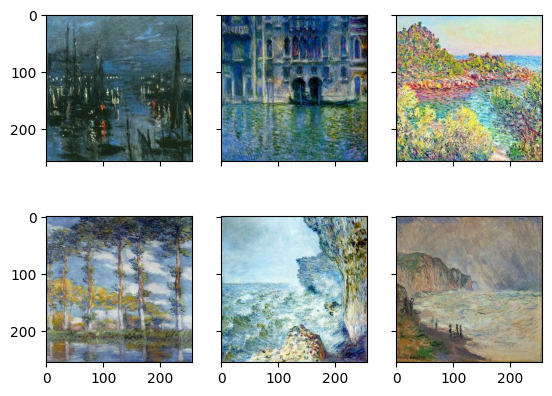

In [4]:
for img in monet:
    fig, ax = plt.subplots(2, 3, sharex = True, sharey = True)
    img = ((img.numpy() + 1) * 127.5).astype(np.uint8)
    for i in range(6):
        ax[i // 3, i % 3].imshow(img[i])
    break

###### [Back to Table of Contents](#toc)

### 3.2. Image Augmentation: <a name="aug"></a>

Training a deep learning model off of 300 images isn't that many. 

Let's add some image augmentation/transformations to the dataloader, effectively increasing the size of the dataset size.

**Transformations:**
- Randomly flip the image.
    - Horizontal
    - Vertical
- Random Rotation
- Randomly Crop the Image (interpolates pixels to maintain original image size.)

In [5]:
# Transformation object.
data_augmentation = tf.keras.Sequential([
    tf.keras.layers.RandomFlip("horizontal_and_vertical"),
    tf.keras.layers.RandomRotation(0.1),
    tf.keras.layers.RandomCrop(img_size, img_size)])

# Autotune to set buffer size.
AUTOTUNE = tf.data.AUTOTUNE

# Function to setup the transformations within the dataloader.
def prepare(ds, shuffle = False, augment = False):
  if shuffle:
    ds = ds.shuffle(1000)

  if augment:
    ds = ds.map(lambda x: (data_augmentation(x, training=True)), 
                num_parallel_calls = AUTOTUNE)

  # Prefetch buffer necessary here to ensure proper loading during training.
  return ds.prefetch(buffer_size = AUTOTUNE)

Now we can prepare the dataloader with the function we just created.

In [6]:
monet_transformed = prepare(monet, shuffle = True, augment = True)

Let's plot a few images and see the transformations in practice.

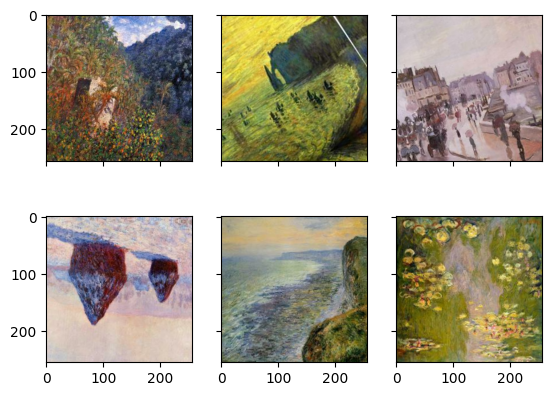

In [8]:
for img in monet_transformed:
    fig, ax = plt.subplots(2, 3, sharex = True, sharey = True)
    img = ((img.numpy() + 1) * 127.5).astype(np.uint8)
    for i in range(6):
        ax[i // 3, i % 3].imshow(img[i])
    break

Looks good, we can obviously see the rotations and a few flips even without seeing the originals.

###### [Back to Table of Contents](#toc)

## 4. Exploratory Data Analysis (EDA) <a name="eda"></a>

---

Let's load the images outside the dataloader so we can avoid the batching and do a little EDA. Since there are only 300, this isn't too much of a memory hit.

In [9]:
monet_files = os.listdir(f"{data_folder}/monet_jpg")
monet_array = np.zeros((len(monet_files), 256, 256, 3)) # 4D Array with shape (n_images, height, width, channels)
for i, file in enumerate(monet_files):
    img = Image.open(f"{data_folder}/monet_jpg/{file}")
    monet_array[i] = np.asarray(img)

Since a Generative Adversarial Network is going to be trained to generate images in Monet's style from scratch, it might be good to inform ourselves of what color intensities are present within this dataset.

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


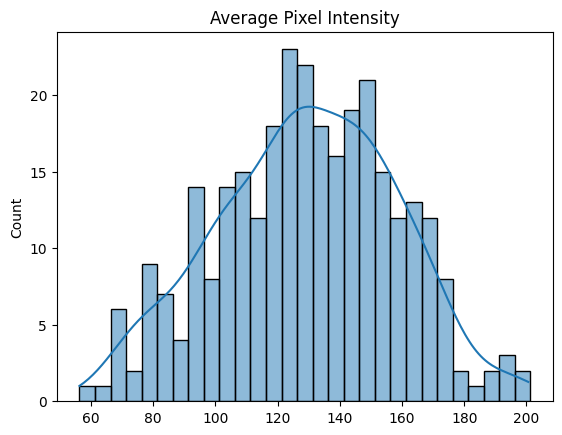

In [10]:
# Find the mean pixel intensity of each image (down to one value along all axes).
mean_intensity = monet_array.mean(axis = 1).mean(axis = 1).mean(axis = 1)

sns.histplot(mean_intensity, binwidth = 5, kde = True)
plt.title('Average Pixel Intensity')
plt.show()

Look at the mean pixel intensity value of each image here, we can see that there aren't many images skewing white (close to 255, right) or black (close to 0, left). Most images sit near the middle around 130 (127.5 would be center).

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


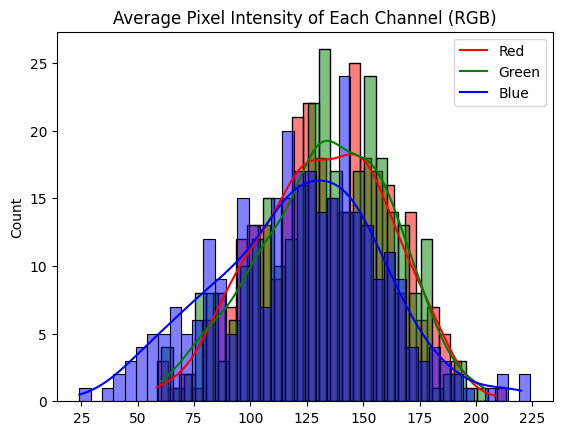

In [11]:
mean_intensity_rgb = monet_array.mean(axis = 1).mean(axis = 1)

# Plot the distribution of the mean intensities of individual RGB channels.
rgb_dict = {0:'Red', 1:'Green', 2:'Blue'}
for i in rgb_dict.keys():
    sns.histplot(mean_intensity_rgb[:,i], color = rgb_dict[i], binwidth = 5, kde = True)#, ax = ax[i])
plt.title('Average Pixel Intensity of Each Channel (RGB)')
plt.legend(list(rgb_dict.values()))
plt.show()

- There doesn't seem to be too much difference in the distribution besides maybe a skew of the blue channel.
- The green and red distributions are very similar.

It seems Monet painted with a wide variety of colors and this should be present in the final generations.

###### [Back to Table of Contents](#toc)

## 5. Models <a name="models"></a>

---

### 5.1. Deep Convolutional Generative Adversarial Network (DCGAN) <a name="gan"></a>

Instead of performing style-transfer like pix2pix or with a CycleGAN, I plan to train a DCGAN to generate Monet-like images and see how well it performs in this competition.

To review, a DCGAN is a variation of the more general GAN models that utilizes deep convolutional layers in both the discriminator and generator. This, of course, means this type of model is adept at image data. 

DCGANs are comprised of two models, the Discriminator whose purpose is to identify (discriminate) real images from fake ones, and the Generator whose role is to generate images that hopefully imitate real images well enough to fool the Discriminator. The two goals of these models are diametrically opposed to each other, meaning if one is succeeding, the other is failing. This can be seen in the loss of each model, but there is no perfect metric to know when the model has converged, overfit, or suffered mode collapse (more on this later). This fact makes tuning a GAN model fairly subjective and requires balancing the two models so that they converge into a working model which be a difficult and time-consuming process.

In [12]:
latent_dim = 512
epochs = 250
num_img_saved = 1

# Image dir saved per epoch.
! mkdir /kaggle/working/Generated_Images
# Image dir saved for submission.
! mkdir /kaggle/working/images

/opt/conda/lib/python3.10/pty.py:89: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  pid, fd = os.forkpty()


Now we can initialize the Discriminator (sometimes called the Critic depending on application).

Generally the role of the discriminator isn't unlike a CNN used in classification: downsample an image into a feature space and classify it.

It's very important to not only plan the architectures of the discriminator and generator (input shapes vs output shapes, filter size, number of filters, strides, etc), but also choose the proper activation functions, especially for the last layers.

Since we're using Binary Cross Entropy as the loss function, the last layer can either use a sigmoid activation function or ensure the loss function specifies `from_logits = True`.

In [13]:
discriminator = tf.keras.Sequential(
    [tf.keras.Input(shape = (img_size, img_size, 3)),
     tf.keras.layers.Conv2D(64, kernel_size = 5, strides = 2, padding = 'same', use_bias = False),
     #tf.keras.layers.BatchNormalization(),
     tf.keras.layers.LeakyReLU(negative_slope = 0.2),
     tf.keras.layers.Conv2D(128, kernel_size = 5, strides = 2, padding = 'same', use_bias = False),
     tf.keras.layers.BatchNormalization(),
     tf.keras.layers.LeakyReLU(negative_slope = 0.2),
     tf.keras.layers.Conv2D(128, kernel_size = 5, strides = 2, padding = 'same', use_bias = False),
     tf.keras.layers.BatchNormalization(),
     tf.keras.layers.LeakyReLU(negative_slope = 0.2),
     tf.keras.layers.Conv2D(256, kernel_size = 5, strides = 2, padding = 'same', use_bias = False),
     tf.keras.layers.BatchNormalization(),
     tf.keras.layers.LeakyReLU(negative_slope = 0.2),
     tf.keras.layers.Conv2D(256, kernel_size = 5, strides = 2, padding = 'same', use_bias = False),
     tf.keras.layers.BatchNormalization(),
     tf.keras.layers.LeakyReLU(negative_slope = 0.2),
     tf.keras.layers.Flatten(),
     tf.keras.layers.Dropout(0.2),
     tf.keras.layers.Dense(1)],
     name = 'Discriminator')

discriminator.summary()

Model: "Discriminator"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 128, 128, 64)   │         4,800 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu (LeakyReLU)         │ (None, 128, 128, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 64, 64, 128)    │       204,800 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 64, 64, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_1 (LeakyReLU)       │ (None, 64, 64, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 32, 32, 128)    │       409,600 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 32, 32, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_2 (LeakyReLU)       │ (None, 32, 32, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 16, 16, 256)    │       819,200 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 16, 16, 256)    │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_3 (LeakyReLU)       │ (None, 16, 16, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 8, 8, 256)      │     1,638,400 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 8, 8, 256)      │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_4 (LeakyReLU)       │ (None, 8, 8, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 16384)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 16384)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 1)              │        16,385 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,096,257 (11.81 MB)

 Trainable params: 3,094,721 (11.81 MB)

 Non-trainable params: 1,536 (6.00 KB)

Now for the Generator.

This model requires us to architect a random latent vector as an input, then upsample this vector through an emergent feature space to the size of a real image which will then be input into the Discriminator during training. Several different model architectures can work here and many variations of GANs can be identified by the Generator's shape.

Here, we have a choice of activation function in the last layer which mostly depends on the range of pixel values of our images. In this case we normalized the images into the space of [-1, 1] so the hyperbolic tangent (tanh) activation function has been chosen. If we had normalized from [0, 1], the sigmoid function would be appropriate. Tanh seems to be accepted practice by performing the best in GANs, however.

In [14]:
# # Shallow DCGAN
# generator = tf.keras.Sequential(
#     [tf.keras.Input(shape = (latent_dim, )),
#      tf.keras.layers.Dense(16 * 16 * latent_dim),
#      tf.keras.layers.Reshape((16, 16, latent_dim)),
#      tf.keras.layers.Conv2DTranspose(256, kernel_size = 5, strides = 2, padding = 'same', use_bias = False),
#      #tf.keras.layers.BatchNormalization(),
#      tf.keras.layers.LeakyReLU(negative_slope = 0.2),
#      tf.keras.layers.Conv2DTranspose(256, kernel_size = 5, strides = 2, padding = 'same', use_bias = False),
#      tf.keras.layers.BatchNormalization(),
#      tf.keras.layers.LeakyReLU(negative_slope = 0.2),
#      tf.keras.layers.Conv2DTranspose(512, kernel_size = 5, strides = 2, padding = 'same', use_bias = False),
#      tf.keras.layers.BatchNormalization(),
#      tf.keras.layers.LeakyReLU(negative_slope = 0.2),
#      tf.keras.layers.Conv2DTranspose(512, kernel_size = 5, strides = 2, padding = 'same', use_bias = False),
#      tf.keras.layers.BatchNormalization(),
#      tf.keras.layers.LeakyReLU(negative_slope = 0.2),
#      tf.keras.layers.Conv2D(3, kernel_size = 7, padding = 'same', activation = 'tanh')],
#      name = 'Generator')
# generator.summary()

# # Flipped DCGAN
# generator = tf.keras.Sequential(
#     [tf.keras.Input(shape = (latent_dim, )),
#      tf.keras.layers.Dense(4 * 4 * latent_dim),
#      tf.keras.layers.Reshape((4, 4, latent_dim)),
#      tf.keras.layers.Conv2DTranspose(512, kernel_size = 5, strides = 2, padding = 'same', use_bias = False),
#      #tf.keras.layers.BatchNormalization(),
#      tf.keras.layers.LeakyReLU(negative_slope = 0.2),
#      tf.keras.layers.Conv2DTranspose(256, kernel_size = 5, strides = 2, padding = 'same', use_bias = False),
#      tf.keras.layers.BatchNormalization(),
#      tf.keras.layers.LeakyReLU(negative_slope = 0.2),
#      tf.keras.layers.Conv2DTranspose(128, kernel_size = 5, strides = 2, padding = 'same', use_bias = False),
#      tf.keras.layers.BatchNormalization(),
#      tf.keras.layers.LeakyReLU(negative_slope = 0.2),
#      tf.keras.layers.Conv2DTranspose(128, kernel_size = 5, strides = 2, padding = 'same', use_bias = False),
#      tf.keras.layers.BatchNormalization(),
#      tf.keras.layers.LeakyReLU(negative_slope = 0.2),
#      tf.keras.layers.Conv2D(3, kernel_size = 7, padding = 'same', activation = 'tanh')],
#      name = 'Generator')
# generator.summary()

# Deeper DCGAN
generator = tf.keras.Sequential(
    [tf.keras.Input(shape = (latent_dim, )),
     tf.keras.layers.Dense(16 * 16 * latent_dim),
     tf.keras.layers.Reshape((16, 16, latent_dim)),
     tf.keras.layers.Conv2DTranspose(512, kernel_size = 5, strides = 2, padding = 'same', use_bias = False),
     #tf.keras.layers.BatchNormalization(),
     tf.keras.layers.LeakyReLU(negative_slope = 0.2),
     tf.keras.layers.Conv2DTranspose(256, kernel_size = 5, strides = 2, padding = 'same', use_bias = False),
     tf.keras.layers.BatchNormalization(),
     tf.keras.layers.LeakyReLU(negative_slope = 0.2),
     tf.keras.layers.Conv2DTranspose(128, kernel_size = 5, strides = 2, padding = 'same', use_bias = False),
     tf.keras.layers.BatchNormalization(),
     tf.keras.layers.LeakyReLU(negative_slope = 0.2),
     tf.keras.layers.Conv2DTranspose(64, kernel_size = 5, strides = 2, padding = 'same', use_bias = False),
     tf.keras.layers.BatchNormalization(),
     tf.keras.layers.LeakyReLU(negative_slope = 0.2),
     tf.keras.layers.Conv2D(32, kernel_size = 5, padding = 'same', use_bias = False),
     tf.keras.layers.BatchNormalization(),
     tf.keras.layers.LeakyReLU(negative_slope = 0.2),
     tf.keras.layers.Conv2D(3, kernel_size = 7, padding = 'same', activation = 'tanh')],
     name = 'Generator')
generator.summary()

Model: "Generator"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1 (Dense)                 │ (None, 131072)         │    67,239,936 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ reshape (Reshape)               │ (None, 16, 16, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose                │ (None, 32, 32, 512)    │     6,553,600 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_5 (LeakyReLU)       │ (None, 32, 32, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose_1              │ (None, 64, 64, 256)    │     3,276,800 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_4           │ (None, 64, 64, 256)    │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_6 (LeakyReLU)       │ (None, 64, 64, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose_2              │ (None, 128, 128, 128)  │       819,200 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_5           │ (None, 128, 128, 128)  │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_7 (LeakyReLU)       │ (None, 128, 128, 128)  │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose_3              │ (None, 256, 256, 64)   │       204,800 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_6           │ (None, 256, 256, 64)   │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_8 (LeakyReLU)       │ (None, 256, 256, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 256, 256, 32)   │        51,200 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_7           │ (None, 256, 256, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_9 (LeakyReLU)       │ (None, 256, 256, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_6 (Conv2D)               │ (None, 256, 256, 3)    │         4,707 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 78,152,163 (298.13 MB)

 Trainable params: 78,151,203 (298.12 MB)

 Non-trainable params: 960 (3.75 KB)

Now we need a way for these two models to be set up in an adversarial way. The following class will handle the training program.

In [15]:
# GAN Class was altered from https://keras.io/examples/generative/dcgan_overriding_train_step/
class GAN(tf.keras.Model):
    def __init__(self, discriminator, generator, latent_dim):
        super().__init__()
        self.discriminator = discriminator
        self.generator = generator
        self.latent_dim = latent_dim
        # self.seed_generator = tf.keras.random.SeedGenerator(rand_seed)

    def compile(self, d_optimizer, g_optimizer, loss_fn):
        super().compile()
        self.d_optimizer = d_optimizer
        self.g_optimizer = g_optimizer
        self.loss_fn = loss_fn
        self.d_loss_metric = tf.keras.metrics.Mean(name = "D_Loss")
        self.g_loss_metric = tf.keras.metrics.Mean(name = "G_Loss")

    @property
    def metrics(self):
        return [self.d_loss_metric, self.g_loss_metric]

    def train_step(self, real_images):
        # Sample random points in the latent space.
        batch_size = tf.keras.ops.shape(real_images)[0]
        random_latent_vectors = tf.keras.random.normal(
            shape=(batch_size, self.latent_dim))#, seed=self.seed_generator)

        # Decode the latent space to a fake image.
        generated_images = self.generator(random_latent_vectors)

        # Zip with real images.
        combined_images = tf.keras.ops.concatenate([generated_images, real_images], axis=0)

        # # Assemble labels discriminating real from fake images.
        # labels = tf.keras.ops.concatenate([tf.keras.ops.ones((batch_size, 1)), tf.keras.ops.zeros((batch_size, 1))], axis=0)
        
        # # Add noise to labels.
        # labels += 0.05 * tf.random.uniform(tf.shape(labels))

        # Create labels for real (1) and fake (0) images
        real_labels = tf.ones((batch_size, 1))
        fake_labels = tf.zeros((batch_size, 1))

        # Apply label smoothing: change real labels from 1 to a value like 0.9
        smoothed_real_labels = real_labels * 0.9  # Real label smoothing
        combined_labels = tf.concat([smoothed_real_labels, fake_labels], axis=0)

        # Add some noise to the labels (optional but can help)
        combined_labels += 0.05 * tf.random.uniform(tf.shape(combined_labels))

        # Train the discriminator.
        with tf.GradientTape() as tape:
            predictions = self.discriminator(combined_images)
            d_loss = self.loss_fn(combined_labels, predictions)
        grads = tape.gradient(d_loss, self.discriminator.trainable_weights)
        self.d_optimizer.apply_gradients(
            zip(grads, self.discriminator.trainable_weights))

        # Sample random points in the latent space.
        random_latent_vectors = tf.keras.random.normal(
            shape=(batch_size, self.latent_dim))#, seed=self.seed_generator)

        # Assemble misleading labels that show all real images.
        misleading_labels = tf.keras.ops.zeros((batch_size, 1))

        # Train the generator.
        with tf.GradientTape() as tape:
            predictions = self.discriminator(self.generator(random_latent_vectors))
            g_loss = self.loss_fn(misleading_labels, predictions)
        grads = tape.gradient(g_loss, self.generator.trainable_weights)
        self.g_optimizer.apply_gradients(zip(grads, self.generator.trainable_weights))

        # Update loss metrics.
        self.d_loss_metric.update_state(d_loss)
        self.g_loss_metric.update_state(g_loss)
        return {"d_loss": self.d_loss_metric.result(),
                "g_loss": self.g_loss_metric.result()}

Here we can create a callback for tensorflow to use at the end of each epoch. This class and function will save randomly generated images after each epoch -- This is incredibly important for the subjective tuning and analysis of how well the model performs as mode collapse or non-convergence can happen at any time during the training of a GAN.

In [16]:
class GANMonitor(tf.keras.callbacks.Callback):
    def __init__(self, num_img=3, latent_dim=latent_dim):
        self.num_img = num_img
        self.latent_dim = latent_dim
        # self.seed_generator = tf.keras.random.SeedGenerator(rand_seed)

    # Save a few generated images at each epoch.
    def on_epoch_end(self, epoch, logs=None):
        random_latent_vectors = tf.keras.random.normal(shape=(self.num_img, self.latent_dim))
        generated_images = self.model.generator(random_latent_vectors, training = False)
        generated_images = (generated_images + 1) * 127.5
        for i in range(self.num_img):
            img = tf.keras.utils.array_to_img(generated_images[i])
            img.save(f"{current_wdir}/Generated_Images/{epoch+1:03}_{i}.jpg")
        
        # In the case of mode collapse for kaggle submissions.
        if epoch > (epochs - 21):           
        # Sorry for anyone who reads this next section, it's convoluted in its methods.
            n = 400
            random_latent_vectors = tf.keras.random.normal(shape=(n, 512))
            for i in range(int(n/100)):
                # print('####', i*100, (i+1)*100)
                generated_images = self.model.generator(random_latent_vectors[i*100: (i+1)*100], training = False)
                generated_images = (generated_images + 1) * 127.5
                n_range = np.linspace(i*100, ((i+1)*100)-1, int(n/4), dtype = int)
                for i, j in enumerate(n_range):
                    # print('-',i)
                    img = tf.keras.utils.array_to_img(generated_images[i])
                    img.save(f"{current_wdir}/images/{epoch+1:03}_{j}.jpg")

In [17]:
# Supress TF warning messages.
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'
# Check to make sure GPU will be used.
tf.config.list_physical_devices('GPU')

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]

In [18]:
gan = GAN(discriminator = discriminator, generator = generator, latent_dim = latent_dim)
gan.compile(
    d_optimizer=tf.keras.optimizers.Adam(learning_rate = 0.0001, beta_1 = 0.5, beta_2 = 0.9),
    g_optimizer=tf.keras.optimizers.Adam(learning_rate = 0.0002, beta_1 = 0.5, beta_2 = 0.9),
    loss_fn = tf.keras.losses.BinaryCrossentropy(from_logits = True))

with tf.device('/device:GPU:0'):
    history_gan = gan.fit(monet_transformed,
                          epochs = epochs,
                          callbacks = [GANMonitor(num_img = num_img_saved, latent_dim = latent_dim)])

Epoch 1/250


I0000 00:00:1727903939.355562     131 service.cc:145] XLA service 0x7d2888002120 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1727903939.355642     131 service.cc:153]   StreamExecutor device (0): Tesla P100-PCIE-16GB, Compute Capability 6.0
W0000 00:00:1727903939.713769     131 random_ops.cc:59] Warning: Using tf.random.uniform with XLA compilation will ignore seeds; consider using tf.random.stateless_uniform instead if reproducible behavior is desired. random_uniform/RandomUniform
I0000 00:00:1727903965.095241     131 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


19/19 ━━━━━━━━━━━━━━━━━━━━ 61s 2s/step - d_loss: 0.5995 - g_loss: 0.7060
Epoch 2/250
19/19 ━━━━━━━━━━━━━━━━━━━━ 8s 416ms/step - d_loss: 0.5243 - g_loss: 0.7792
Epoch 3/250
19/19 ━━━━━━━━━━━━━━━━━━━━ 8s 417ms/step - d_loss: 0.4333 - g_loss: 0.8907
Epoch 4/250
19/19 ━━━━━━━━━━━━━━━━━━━━ 8s 416ms/step - d_loss: 0.4048 - g_loss: 1.1171
Epoch 5/250
19/19 ━━━━━━━━━━━━━━━━━━━━ 8s 417ms/step - d_loss: 0.4802 - g_loss: 1.2327
Epoch 6/250
19/19 ━━━━━━━━━━━━━━━━━━━━ 8s 417ms/step - d_loss: 0.6898 - g_loss: 1.0059
Epoch 7/250
19/19 ━━━━━━━━━━━━━━━━━━━━ 8s 418ms/step - d_loss: 0.6458 - g_loss: 1.2977
Epoch 8/250
19/19 ━━━━━━━━━━━━━━━━━━━━ 8s 417ms/step - d_loss: 0.6970 - g_loss: 0.8350
Epoch 9/250
19/19 ━━━━━━━━━━━━━━━━━━━━ 8s 419ms/step - d_loss: 0.6178 - g_loss: 1.4931
Epoch 10/250
19/19 ━━━━━━━━━━━━━━━━━━━━ 8s 419ms/step - d_loss: 0.6441 - g_loss: 0.8571
Epoch 11/250
19/19 ━━━━━━━━━━━━━━━━━━━━ 8s 419ms/step - d_loss: 0.7234 - g_loss: 1.3230
Epoch 12/250
19/19 ━━━━━━━━━━━━━━━━━━━━ 8s 418ms/step -

###### [Back to Table of Contents](#toc)

## 6. Results and Discussion <a name="results"></a>

---

Now that the model has finished training over the course of 250 epochs, let's plot the loss values for both the Generator and Discriminator throughout training.

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


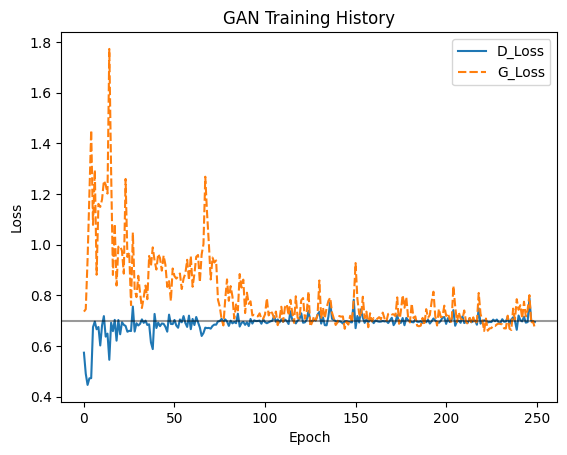

In [19]:
history_gan_df = pd.DataFrame({'D_Loss': history_gan.history['d_loss'], 'G_Loss': history_gan.history['g_loss']})

sns.lineplot(history_gan_df)
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('GAN Training History')
plt.axhline(y = 0.7, c = 'k', alpha = 0.4)
plt.savefig('./Generated_Images/GAN_History.jpg')
plt.show()

A few things to note:
- The thin black line was plotted across the y-axis at 0.7 which is typically where both models "fight" around.
- We can see where if one model performs well (low loss value), the other receives a spike in loss.
- During the first 75 epochs both models but especially the Generator's loss oscillated pretty heavily.
- The models finally converged and became quite stable sometime after 150 epochs with much smaller oscillations.

It's also important to note that while the loss stabilized, it still jitters which isn't necessarily a bad thing. This means each model is potentially still learning. However, again, this process is very subjective and close analysis is the only thing that can be done to determine when to stop training the model. 250 epochs was chosen after much trial an error, analyzing the generated images at each epoch.

Speaking of which, now let's plot a generated image from every 5 epochs.

In [20]:
# Load generated images from each epoch.
gen_images_files = os.listdir(f"{current_wdir}/Generated_Images")
gen_images = {}

for file in gen_images_files:
    # Skip non-image files.
    if '.jpg' not in file:
        continue
    # Separate epoch number, image number, and file extension.
    epoch, _ = file.split('_')
    if '0' not in _:
        continue
    img = Image.open(f"{current_wdir}/Generated_Images/{file}")
    gen_images[epoch] = np.asarray(img)

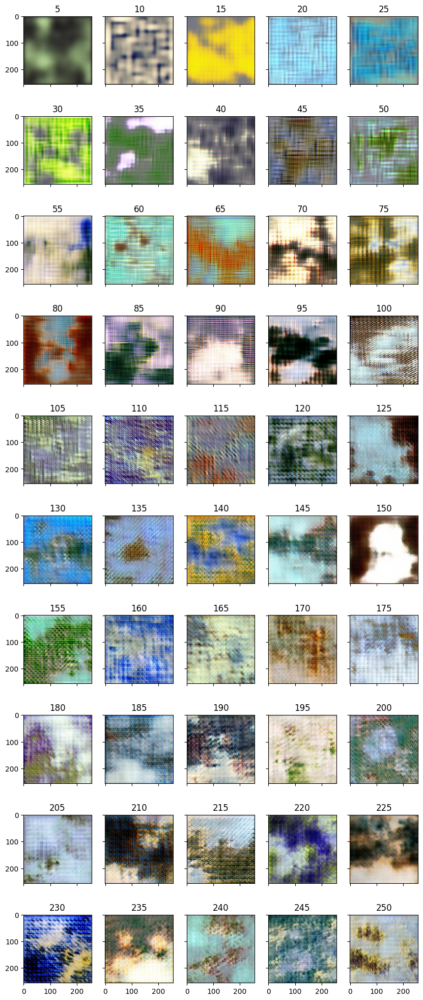

In [21]:
# Plot an image from every 5 epochs.
fig, ax = plt.subplots(int((len(range(5, epochs+1, 5)) / 5)), 5, figsize = (10,int(epochs/10)), sharex = True, sharey = True)
for i, idx in enumerate(range(5, epochs+1, 5)):
    ax[i // 5, i % 5].imshow(gen_images[f'{str(idx).zfill(3)}'])
    ax[i // 5, i % 5].set_title(f'{idx}')
plt.savefig('./Generated_Images/5_Epoch_Images.jpg')
plt.show()

- Similar to the story the training loss history showed, we can see a clear difference in images from the early epochs to the end, not gaining a sharper focus until after 150. 
- We also see a sort of cross-hatch quality to the earlier epochs that generally disappears later, but some artifacts remain in the later epochs.
- There is also quite a decent amount of variety here. While no sharp details come to focus, the main Monet-esque characteristics are coming through.

Now, let's take a closer look at the last 20 epochs to get a better idea of the generative abilities of this model.

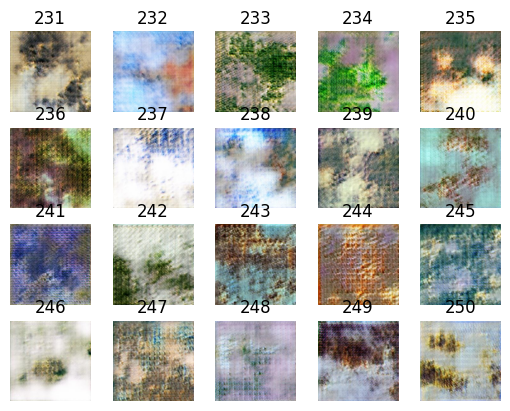

In [22]:
# Plot a generated image from the last 20 epochs.
last_gen_img_idx = range(epochs-19, epochs+1, 1)
fig, ax = plt.subplots(4, 5, sharex = True, sharey = True)
for i, idx in enumerate(last_gen_img_idx):
    ax[i // 5, i % 5].imshow(gen_images[f'{str(idx).zfill(3)}'])
    ax[i // 5, i % 5].set_title(f'{idx}')
    ax[i // 5, i % 5].axis('off')
#fig.tight_layout()
plt.savefig('./Generated_Images/Last_20_Images.jpg')
plt.show()

These look great! When looking through the full Monet dataset you definitely can see where these generated images are taking qualities from.

Finally, let's talk about this model's "skeleton in the closet" so to speak...

It seems to suffer from **Mode Collapse**.

To demonstrate this we will randomly generate 6 latent vectors and input them through the Generator to generate 6 images from the trained and finished model.

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


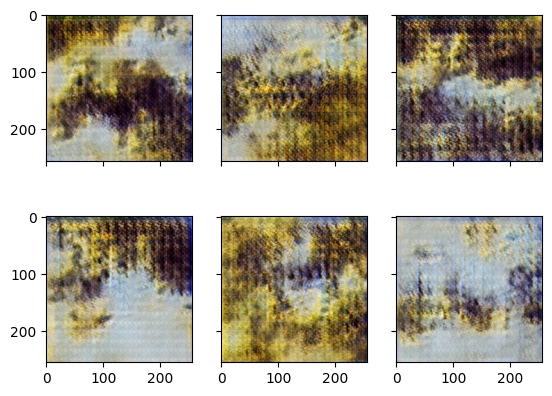

In [23]:
fig, ax = plt.subplots(2, 3, sharex = True, sharey = True)
prediction = generator.predict(np.random.normal(size = (6,latent_dim)))
prediction = ((prediction + 1) * 127.5).astype(np.uint8)
for i in range(6):
    ax[i // 3, i % 3].imshow(prediction[i])
plt.show()

It's immediately apparent that each of these images are in the same "style" with the same color pallette. At each epoch the model would switch "styles" and colors but only every produce one type during that epoch. This is typically indicative of Mode Collapse which usually shows itself in this way -- where the Generator produces a very limited set of outputs. Many things can cause Mode Collapse and is what makes training GANs so difficult as it can be quite prevalent. 

**Causes of Mode Collapse (in no particular order):**

1. The Discriminator dominates the Generator, thus stifling the training process by never allowing the Generator to learn from a wider range of samples.
2. Small, unbalanced, or low diversity of samples in the training dataset.
3. Poor tuning of hyperparameters. GANs are heavily affected by their hyperparameters.
4. Choice of loss function. It has been found that Min-Max BCE is difficult to optimize in an adversarial model. Several alternatives exist that don't have as much of an issue with unstable gradients and thus mode collapse, such as Wasserstein loss used in a WGAN.
5. Latent space that is too small or the method of randomization/noise. The latent space generated is the seed in which the Generator creates images so if the space isn't large or varied enough, it will not generate variety.
6. Filter kernel size (too small can be an issue) and number of convolution layers.
7. Normalization between layers. While generally agreed that normalization layers after convolution is good practice in DCGANs, the tuning and even type is debated. Several alternatives to Batch Normalization have shown to work well.
8. Generator overfits the Discriminator. Essentially always fools the Discriminator, typically collapsing to one or two "modes".

More information on this subject and sources for some of this can be found in the Appendix at the end.

I built countless alterations to this final model to address some of these issues and I believe I narrowed it down quite well, but did not overcome this issue (more on what was done for the final submission for the competition at the end of this section). Below are a summary and general path I took to attempt to solve this issue.

**Methods Attempted to Mitigate Mode Collapse:**

- Batch Normalization: Included after most convolution layers.
- Layer Normalization: According to some sources, works better than batch normalization in GANs, however in this case made the model very unstable and unable to converge, exploding the gradients. More tuning is require, but did not pursue further.
- Deeper Generator and Discriminator Networks: Added one more layer to the Discriminator and eventually two to the Generator (this improved performance, but not mode collapse.)
- Larger Latent Space (128 to 256 to 512): In case this was the limiting factor, the latent vector size was increased several times.
- Different Random Noise in Latent Space: Random values from normal distributions and uniform were tried. Normal seemed to produce better results for me.
- Different Filter Kernel Sizes in both Generator: Went from 3 to 4 to 5. (5,5) performed the best but did not solve mode collapse.
- One-Sided Label Smoothing for the Discriminator: Allowing for noise in the Discriminator labels for positive classes (1) down to 0.9 can help the Generator during training. You can find this in the `GAN` class, `train_step` function.
- Remove All Seeds for Latent Vector Initialization: In an attempt for more randomness, worrying seeding the latent space was holding the generator back, these seeds were removed.
- Adjust Beta 1 and 2 on Adam Optimizers for Generator and Discriminator: Improved performance quite a bit, but did not solve mode collapse.
- Raise Learning Rate on Generator (0.0002), leaving Discriminators at 0.0001: This allows the Generator to learn faster while slowing down the Discriminator.
- Flipped Generator Convolution Filter Number to Start at 512 and Decrease: Model still works, but didn't help.
- Remove Bias from Upper Convolution Layers: Adjust parameter `bias = false`. Noticed many CycleGANs utilize this, but never found a source for the reason.
- Larger Filters in Discriminator: In many examples found, the filter sizes are the same between both models so I made them match after increasing the Generator to (5, 5) earlier.
- Countless hyperparameter adjustments.

There is quite a lot more information that I haven't touched on this subject, but let's leave it here for now and complete the project.

Now to prepare the submission.

In [24]:
# generated_images = generator.predict(np.random.normal(size = (7000,latent_dim)))
# generated_images = (generated_images + 1) * 127.5
# for i in range(7000):
#     img = tf.keras.utils.array_to_img(generated_images[i])
#     img.save(f"{current_wdir}/images/{epochs}_{i}.jpg")

In [25]:
import shutil
shutil.make_archive("/kaggle/working/images", 'zip', "/kaggle/working/images")

'/kaggle/working/images.zip'

As mentioned above, even though the final model still suffered from mode collapse, upon analyzing the generated images during training, I decided there was still a way to submit a variety of images.

Each epoch saw the Generator produce images with a new style (mode), and since training of the final epochs saw minimal differences between these final epochs -- Images were generated and sampled the final 20 epochs.

Here is a sample of those images.

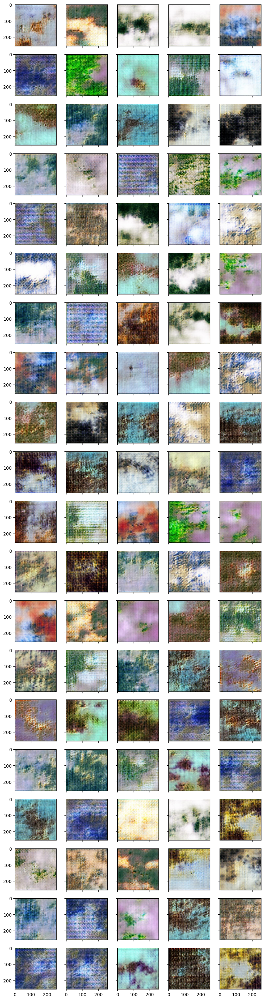

In [26]:
last_20_files = os.listdir(f"{current_wdir}/images")
rand_last_20_images = []

for file in np.random.choice(last_20_files, 100, replace = False):
    # Skip non-image files.
    if '.jpg' not in file:
        continue
    # Separate epoch number, image number, and file extension.
    epoch, num = file.split('_')
    img = Image.open(f"{current_wdir}/images/{file}")
    rand_last_20_images.append(np.asarray(img))

fig, ax = plt.subplots(20, 5, figsize = (10,40), sharex = True, sharey = True)
for i, img in enumerate(rand_last_20_images):
    ax[i // 5, i % 5].imshow(img)
plt.show()

And as a reminder of a few of the Monet paintings for comparison...

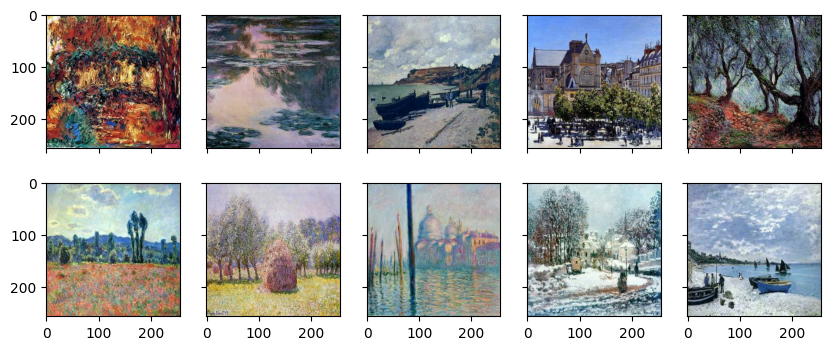

In [31]:
for img in monet:
    fig, ax = plt.subplots(2, 5, figsize = (10,4), sharex = True, sharey = True)
    img = ((img.numpy() + 1) * 127.5).astype(np.uint8)
    for i in range(10):
        ax[i // 5, i % 5].imshow(img[i])
    break

Is it going to fool any art buffs and sell for millions of dollars? - No. However, besides the remaining artifcating from the convolutions that makes it look like monet suddenly got into quilting, the generated images do look distinctly Monet-esque. In my opinion they capture the color blocking and combinations of his paintings and even some of his textures.

While this seems like a bit of a work-around, all previously submitted models were only from generated images from the last epoch. You can see below that the previous version scored ~18 higher (Version 12, same architecture only difference is images submitted and randomness, of course). Also, we can see a few previous versions of this model before making the adjustments listed above.

Below you can find a screenshot of all the results from the Kaggle submissions.

<img src="https://github.com/chill0121/Kaggle_Projects/blob/main/Adversarial_Painting/Figures/Kaggle_Submission_Scores.png?raw=true" alt="results" width="1000"/>

Alongside MiFID scores let's look at a sample of a generated image from each of these model versions.

<div style="text-align: center;">
<img src="https://github.com/chill0121/Kaggle_Projects/blob/main/Adversarial_Painting/Figures/Sample_V5.png?raw=true" alt="results" width="150"/>
</div>

- Version 5 received a MiFID score of 335 this model was shallow with only a handful of convolution layers in the Generator, and did not converge on anything visibly Monet-like.

---

<div style="text-align: center;">
<img src="https://github.com/chill0121/Kaggle_Projects/blob/main/Adversarial_Painting/Figures/Sample_V6.png?raw=true" alt="results" width="150"/>
</div>

- Version 6 with the score of 363 was deeper than version 5, with 5 convolutional layers.

---

<div style="text-align: center;">
<img src="https://github.com/chill0121/Kaggle_Projects/blob/main/Adversarial_Painting/Figures/Sample_V7.png?raw=true" alt="results" width="150"/>
</div>

- Version 7 with the score of 206 finally showed a leap in improvement and included many of the changes listed above. Including 6 convolutional layers, a larger latent space, smoothed discriminator labels, etc.

---

<div style="text-align: center;">
<img src="https://github.com/chill0121/Kaggle_Projects/blob/main/Adversarial_Painting/Figures/Sample_V12.png?raw=true" alt="results" width="150"/>
</div>

- Version 12 is the same architecture and hyperparameters as the ones in this final notebook, but only generated images from Generator after training completed (after the final epoch).

---

- Version 16, the final model, scored 128.65 which submitted the images within this notebook that was discussed above. Again, this architecture is the same as version 12, but with added variety added to the submission images by taking samples from the last 20 epochs.

###### [Back to Table of Contents](#toc)

## 7. Conclusion <a name="conclusion"></a>

---



Of course a model that produces a true style-transfer like pix2pix/CycleGAN, training a Generator that uses an auto-encoder or UNET architecture that is able to receive an image as an input, is going to score better than a DCGAN in this competition, but I found this exercise to be a valuable one. 

The subjective nature of building and training a DCGAN that generates Monet-esque images from random noise latent vectors is its own kind of art

### 7.1. Possible Areas for Improvement <a name="improvements"></a>

- Solve Mode Collapse
    - Self-Modulation Layers instead of Batch Normalization
    - Properly tune Layer Normalization
    - Mini-batch training images.
    - Change model to WGAN.

## Appendix A - Online References: <a name="appendixa"></a>

Resources that helped along the way in no particular order.

- Great tutorial for image generation using GANs https://machinelearningmastery.com/how-to-develop-a-generative-adversarial-network-for-a-cifar-10-small-object-photographs-from-scratch/
- Starting point for DCGANs https://keras.io/examples/generative/dcgan_overriding_train_step/
- Solution to Mode Collapse without changing model? https://arxiv.org/pdf/1810.01365
- Identifying unstable GANs and their failure modes https://machinelearningmastery.com/practical-guide-to-gan-failure-modes/

 Exported to HTML via command line using:

- `jupyter nbconvert Adversarial_Painting.ipynb --to html`
- `jupyter nbconvert Adversarial_Painting.ipynb --to html --HTMLExporter.theme=dark`

###### [Back to Table of Contents](#toc)